# Step 1: Find and download a dataset

https://www.kaggle.com/gsutters/economic-freedom

In [1]:
import pandas as pd
import numpy as np
import time
# Found Data Set
df = pd.read_csv('efw_cc.csv')

In [2]:
df = df.fillna(df.mean())
df = df.drop_duplicates(keep = 'first')

In [3]:
df

,year,ISO_code,countries,ECONOMIC FREEDOM,rank,quartile,1a_government_consumption,1b_transfers,1c_gov_enterprises,1d_top_marg_tax_rate,...,3_sound_money,4a_tariffs,4b_regulatory_trade_barriers,4c_black_market,4d_control_movement_capital_ppl,4_trade,5a_credit_market_reg,5b_labor_market_reg,5c_business_reg,5_regulation
0,2016,ALB,Albania,7.54000,34.000000,1.000000,8.232353,7.509902,8.000000,8.000000,...,9.553657,8.963556,7.489905,10.000000,6.406138,8.214900,7.098562,6.916278,6.705863,6.906901
1,2016,DZA,Algeria,4.99000,159.000000,4.000000,2.150000,7.817129,0.000000,4.500000,...,7.253894,6.872533,2.481294,5.563910,1.590362,4.127025,5.100509,5.029513,5.676956,5.268992
2,2016,AGO,Angola,5.17000,155.000000,4.000000,7.600000,8.886739,0.000000,9.500000,...,5.606605,6.989244,2.024949,10.000000,2.044823,5.264754,7.064905,4.560325,4.930271,5.518500
3,2016,ARG,Argentina,4.84000,160.000000,4.000000,5.335294,6.048930,6.000000,4.000000,...,5.614336,6.421600,4.811105,0.000000,4.697482,3.982547,5.419820,5.151405,5.535831,5.369019
4,2016,ARM,Armenia,7.57000,29.000000,1.000000,7.264706,7.748532,8.000000,5.000000,...,9.521940,8.547556,7.194410,10.000000,6.830998,8.143241,9.102046,6.234630,6.797530,7.378069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3721,1970,VEN,Venezuela,7.18000,10.000000,1.000000,6.602003,9.827430,7.000000,5.813177,...,9.713677,8.066667,6.332996,10.000000,8.000000,8.688889,9.679680,6.168449,6.188570,5.312277
3722,1970,VNM,Vietnam,6.51964,68.307026,2.497835,5.862426,7.672901,5.737987,5.813177,...,7.660619,7.078796,6.332996,9.115282,4.376398,6.719849,7.732523,6.168449,6.188570,6.638470
3723,1970,YEM,"Yemen, Rep.",6.51964,68.307026,2.497835,5.862426,7.672901,5.737987,5.813177,...,7.660619,7.078796,6.332996,9.115282,4.376398,6.719849,7.732523,6.168449,6.188570,6.638470
3724,1970,ZMB,Zambia,6.51964,68.307026,2.497835,3.448131,9.105430,0.000000,5.813177,...,5.133689,7.078796,6.332996,0.000000,2.000000,6.719849,7.327327,6.168449,6.188570,6.638470


#### I do Step 2 later in the dataset because i want to clean the full dataset and it doens't make me have to redue the standardization and such over and over. 

# Step 3: Explore your training set. 

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3726 entries, 0 to 3725
Data columns (total 36 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   year                                3726 non-null   int64  
 1   ISO_code                            3726 non-null   object 
 2   countries                           3726 non-null   object 
 3   ECONOMIC FREEDOM                    3726 non-null   float64
 4   rank                                3726 non-null   float64
 5   quartile                            3726 non-null   float64
 6   1a_government_consumption           3726 non-null   float64
 7   1b_transfers                        3726 non-null   float64
 8   1c_gov_enterprises                  3726 non-null   float64
 9   1d_top_marg_tax_rate                3726 non-null   float64
 10  1_size_government                   3726 non-null   float64
 11  2a_judicial_independence            3726 no

In [5]:
df.describe()

,year,ECONOMIC FREEDOM,rank,quartile,1a_government_consumption,1b_transfers,1c_gov_enterprises,1d_top_marg_tax_rate,1_size_government,2a_judicial_independence,...,3_sound_money,4a_tariffs,4b_regulatory_trade_barriers,4c_black_market,4d_control_movement_capital_ppl,4_trade,5a_credit_market_reg,5b_labor_market_reg,5c_business_reg,5_regulation
count,3726.000000,3726.000000,3726.000000,3726.000000,3726.000000,3726.000000,3726.000000,3726.000000,3726.000000,3726.000000,...,3726.000000,3726.000000,3726.000000,3726.000000,3726.000000,3726.000000,3726.000000,3726.000000,3726.000000,3726.000000
mean,2001.347826,6.519640,68.307026,2.497835,5.862426,7.672901,5.737987,5.813177,6.232061,5.019474,...,7.660619,7.078796,6.332996,9.115282,4.376398,6.719849,7.732523,6.168449,6.188570,6.638470
std,12.735125,1.017692,37.114924,1.004518,2.083036,1.842835,2.947849,2.250384,1.316240,1.717851,...,1.657486,1.646470,1.367982,2.247931,2.470715,1.552456,1.939294,1.252802,1.001710,1.112605
min,1970.000000,1.970000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.653797,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.837167,2.009841,1.002000
25%,1995.000000,6.060000,41.000000,2.000000,4.756530,7.031262,4.000000,5.000000,5.468220,4.291498,...,6.817026,6.513333,6.139918,9.115282,2.430524,6.195405,7.218066,5.582599,5.895024,6.166897
50%,2005.000000,6.519640,68.307026,2.497835,5.862426,7.672901,6.000000,5.813177,6.232061,5.019474,...,7.660619,7.078796,6.332996,10.000000,4.376398,6.719849,7.862762,6.168449,6.188570,6.638470
75%,2011.000000,7.220000,93.000000,3.000000,7.285294,9.203883,8.000000,7.000000,7.021097,5.193108,...,9.076838,8.219556,6.966544,10.000000,6.139806,7.721654,9.167698,6.841484,6.421131,7.309809
max,2016.000000,9.190000,162.000000,4.000000,10.000000,10.000000,10.000000,10.000000,9.904651,9.816667,...,9.922187,10.000000,9.833333,10.000000,10.000000,10.000000,10.000000,9.725000,9.503739,9.439828


# Step 4: Data cleaning

In [6]:
df.isnull().sum()

year                                  0
ISO_code                              0
countries                             0
ECONOMIC FREEDOM                      0
rank                                  0
quartile                              0
1a_government_consumption             0
1b_transfers                          0
1c_gov_enterprises                    0
1d_top_marg_tax_rate                  0
1_size_government                     0
2a_judicial_independence              0
2b_impartial_courts                   0
2c_protection_property_rights         0
2d_military_interference              0
2e_integrity_legal_system             0
2f_legal_enforcement_contracts        0
2g_restrictions_sale_real_property    0
2h_reliability_police                 0
2i_business_costs_crime               0
2j_gender_adjustment                  0
2_property_rights                     0
3a_money_growth                       0
3b_std_inflation                      0
3c_inflation                          0


### if values were missing, i would replace it with the mean of the column. ```df = df.fillna(df.mean())```

# Visualizations 
## Step 5: Visualize the data in your training set

In [7]:
corr_matrix = df.corr()
corr_matrix_class = np.abs(corr_matrix['ECONOMIC FREEDOM'])
top_correlations = corr_matrix_class.sort_values(ascending = False)[:24]
#print(top_correlations)

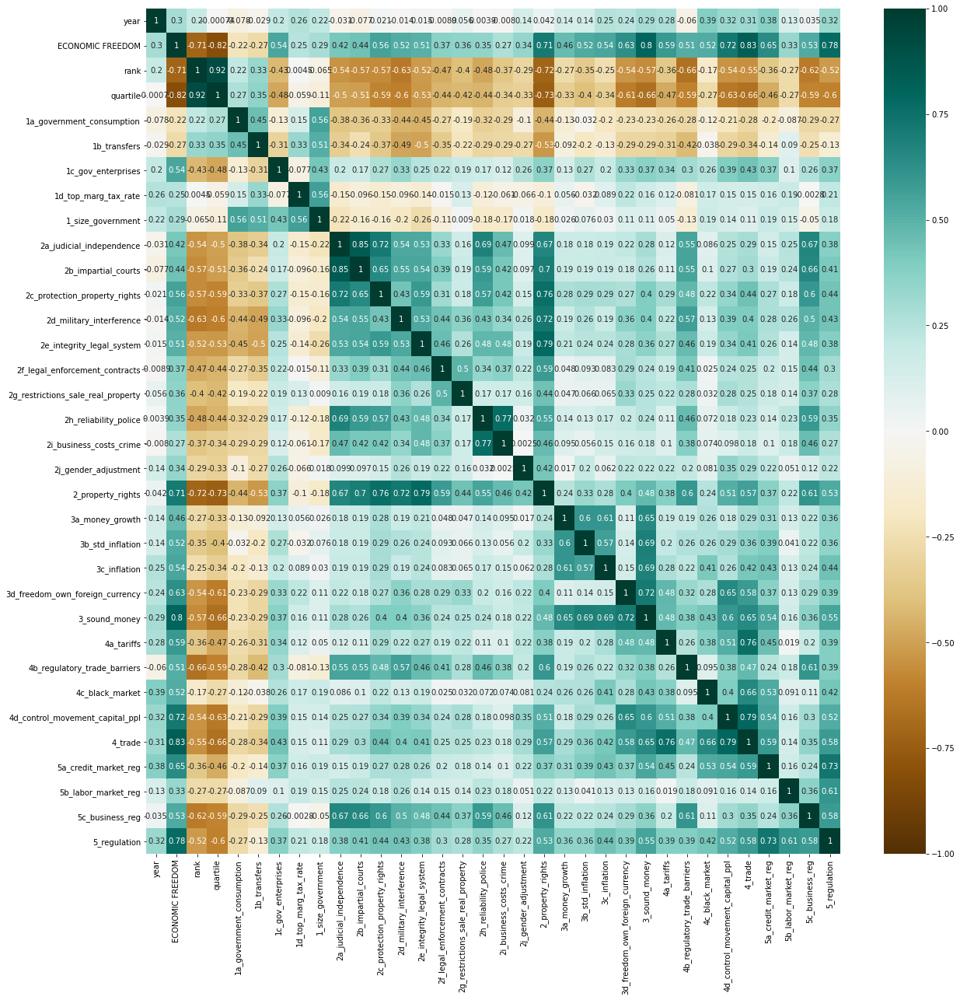

In [8]:
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from scipy import stats

plt.figure(figsize=(20, 20))
heatmap = sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')

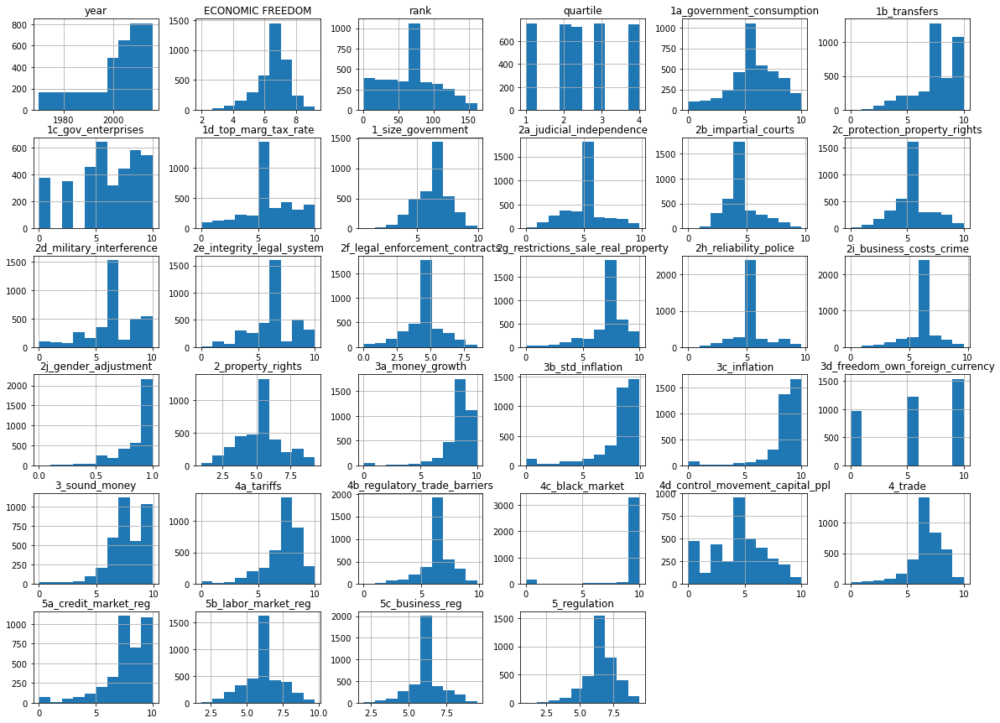

In [9]:
%matplotlib inline
import matplotlib.pyplot as plt
df.hist(bins=10, figsize = (20,15))
plt.show()

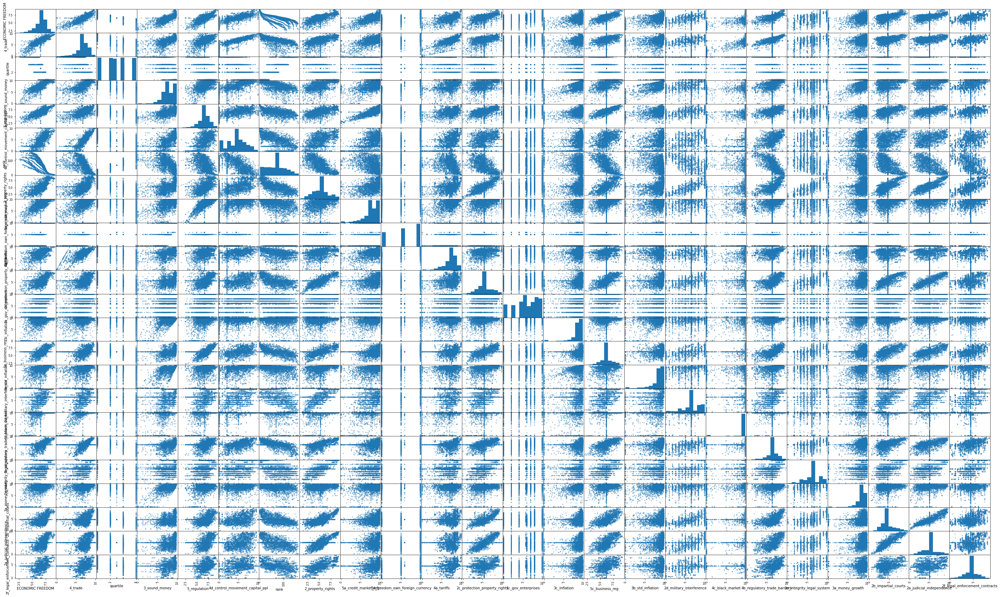

In [10]:
Columns_To_Look_At = top_correlations.index
Dropped_DF = df.loc[:,Columns_To_Look_At]
# Dropped_DF
#Dropped_DF = Dropped_DF.drop_duplicates(keep= 'first')
Dropped_DF
%matplotlib inline
from pandas.plotting import scatter_matrix
scatter_matrix(df[Columns_To_Look_At], figsize = (50,30));

In [11]:
X = Dropped_DF.drop('ECONOMIC FREEDOM', axis = 1)
y = Dropped_DF['ECONOMIC FREEDOM']

In [12]:
print(X.shape, y.shape)

(3726, 23) (3726,)


# Standardization of Dataframe

## Step 6: Apply transformations to your data.

In [13]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler() 
scaled_X = pd.DataFrame(scaler.fit_transform(X),columns = X.columns)  

#scaled_X.columns = X.columns

print(scaled_X.shape, y.shape)

(3726, 23) (3726,)


In [14]:
Economic_Freedom = Dropped_DF['ECONOMIC FREEDOM']
print(scaled_X.shape, Economic_Freedom.shape)
Economic_Freedom.shape

(3726, 23) (3726,)


(3726,)

In [15]:
scaled_df = scaled_X.join(Economic_Freedom)
print(scaled_df.shape)
scaled_df.isna().sum().sum()

(3726, 24)


0

# Histogram and Scatter Plot for Regulard Data

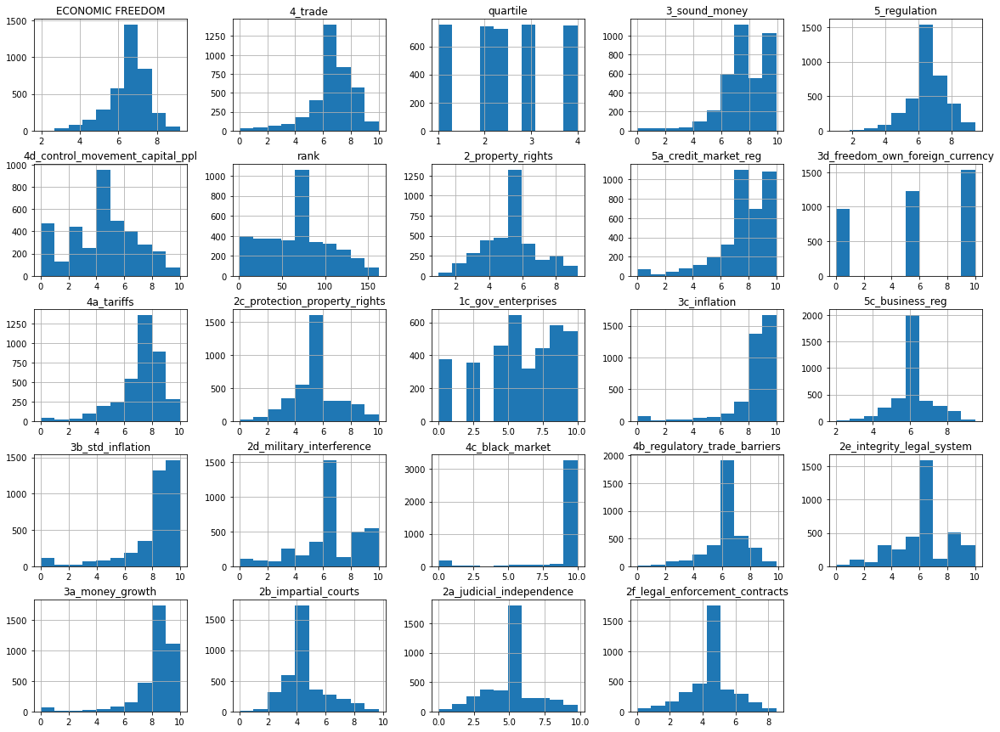

In [16]:
#%matplotlib inline
import matplotlib.pyplot as plt
Dropped_DF.hist(bins=10, figsize = (20,15))
plt.show()

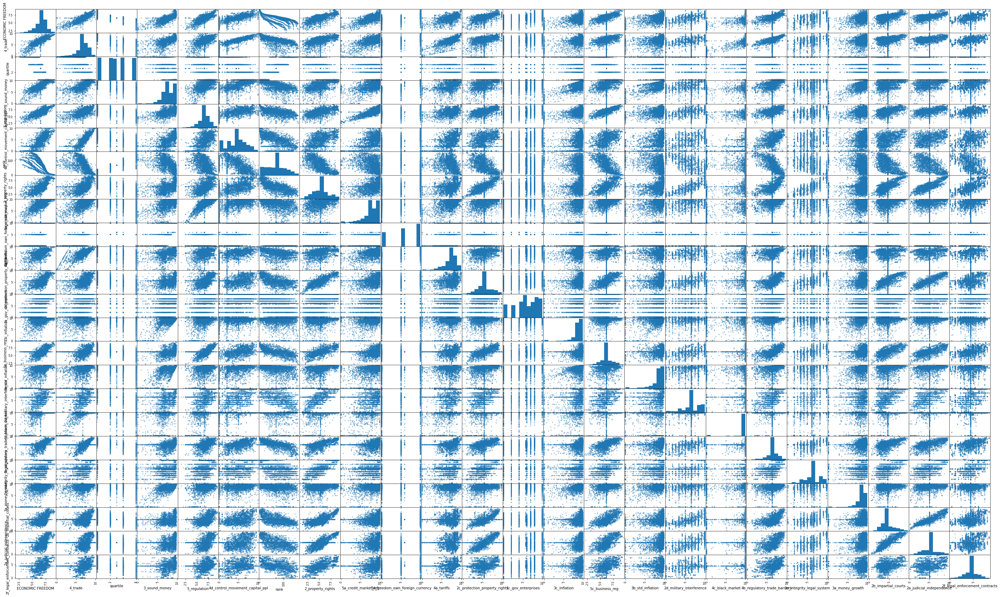

In [17]:
%matplotlib inline
from pandas.plotting import scatter_matrix
scatter_matrix(Dropped_DF, figsize = (50,30));

# Histogram and ScatterPlot for Scaled Data scaled_X

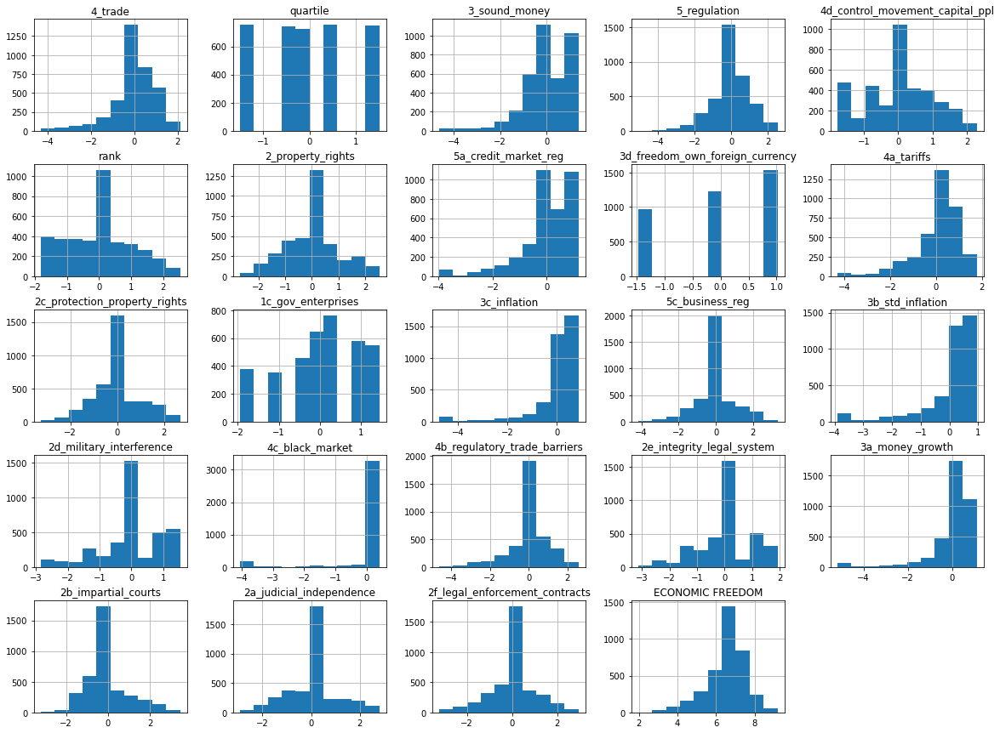

In [18]:
#%matplotlib inline
import matplotlib.pyplot as plt
scaled_df.hist(bins=10, figsize = (20,15))
plt.show()

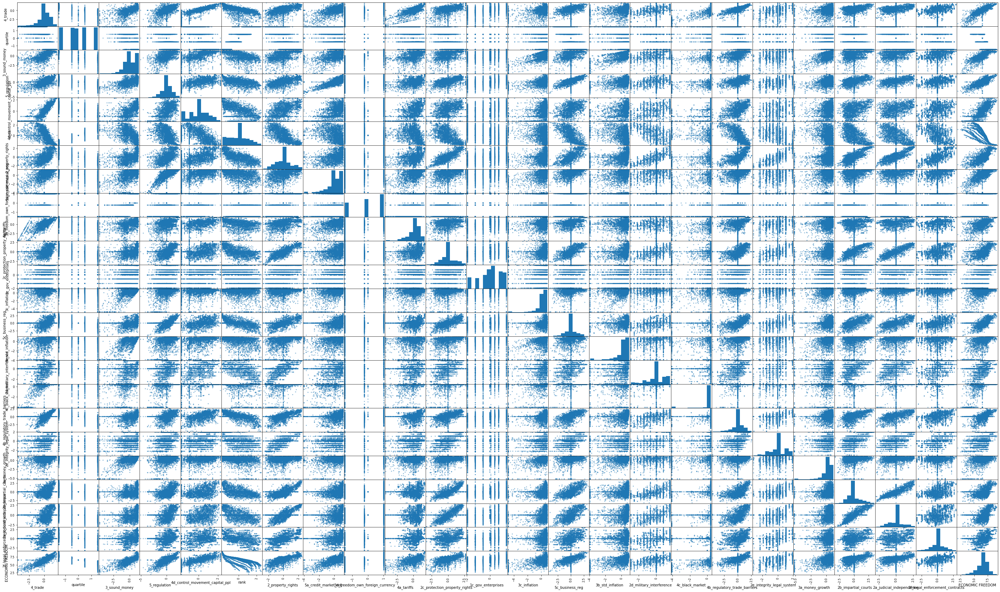

In [19]:
%matplotlib inline
from pandas.plotting import scatter_matrix
scatter_matrix(scaled_df, figsize = (50,30));

# Converting Base Dataset and doing it the way that was asked by the project decription such as squared, cubed, rooted, etc. on two features. 

In [23]:
# Identify Which feature has the highest variance to fix. using .var()

Dropped_DF.var()

#3d_freedom_own_foreign_currency
#1c_gov_enterprises
# These were chosen because they're the highest and I'm not changing rank because they're ment to be the values that they're suppose to be. 




ECONOMIC FREEDOM                      1.035697
4_trade                               2.410120
quartile                              1.009057
3_sound_money                         2.747259
5_regulation                          1.237889
4d_control_movement_capital_ppl       6.104431
rank                               1377.517563
2_property_rights                     2.550191
5a_credit_market_reg                  3.760860
3d_freedom_own_foreign_currency      16.107348
4a_tariffs                            2.710862
2c_protection_property_rights         2.839844
1c_gov_enterprises                    8.689814
3c_inflation                          3.136043
5c_business_reg                       1.003423
3b_std_inflation                      4.211056
2d_military_interference              5.206114
4c_black_market                       5.053193
4b_regulatory_trade_barriers          1.871375
2e_integrity_legal_system             3.916253
3a_money_growth                       2.525477
2b_impartial_

In [41]:
from sklearn.preprocessing import KBinsDiscretizer
Bins = KBinsDiscretizer(n_bins = 10, strategy = 'uniform')
freedom_own_foreign_currency = Dropped_DF['3d_freedom_own_foreign_currency'].values.reshape(-1,1)
Bins.fit(freedom_own_foreign_currency)
print("bin edges: \n", Bins.bin_edges_)
gov_enterprises = Dropped_DF['1c_gov_enterprises'].values.reshape(-1,1)
Bins.fit(gov_enterprises)
print("bin edges: \n", Bins.bin_edges_)

bin edges: 
 [array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.])]
bin edges: 
 [array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.])]


## Normal

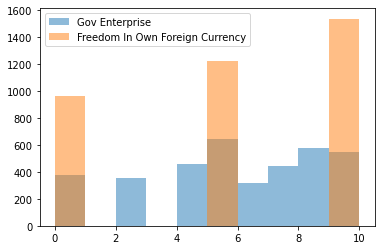

In [49]:
freedom_own_foreign_currency = Dropped_DF['3d_freedom_own_foreign_currency'].values.reshape(-1,1)
gov_enterprises = Dropped_DF['1c_gov_enterprises'].values.reshape(-1,1)
plt.hist(gov_enterprises, label='Gov Enterprise', alpha=0.5, bins = 10)
plt.hist(freedom_own_foreign_currency, label='Freedom In Own Foreign Currency',alpha=0.5, bins = 10)
plt.legend()

array([[<AxesSubplot:xlabel='3d_freedom_own_foreign_currency', ylabel='3d_freedom_own_foreign_currency'>,
        <AxesSubplot:xlabel='1c_gov_enterprises', ylabel='3d_freedom_own_foreign_currency'>],
       [<AxesSubplot:xlabel='3d_freedom_own_foreign_currency', ylabel='1c_gov_enterprises'>,
        <AxesSubplot:xlabel='1c_gov_enterprises', ylabel='1c_gov_enterprises'>]],
      dtype=object)

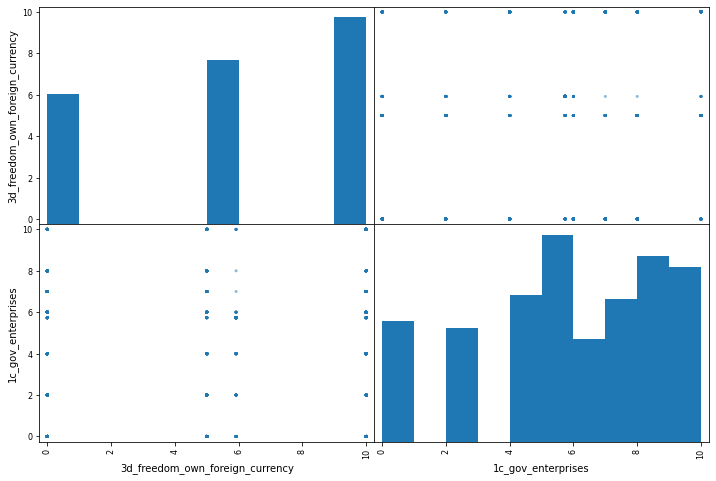

In [55]:
attributes = ['3d_freedom_own_foreign_currency', '1c_gov_enterprises']
scatter_matrix(Dropped_DF[attributes], figsize=(12, 8))

## Squared

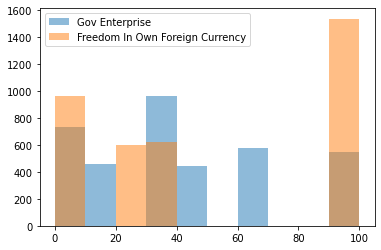

In [46]:
plt.hist(gov_enterprises**2, label='Gov Enterprise', alpha=0.5, bins = 10)
plt.hist(freedom_own_foreign_currency**2, label='Freedom In Own Foreign Currency',alpha=0.5, bins = 10)
plt.legend()

array([[<AxesSubplot:xlabel='3d_freedom_own_foreign_currency', ylabel='3d_freedom_own_foreign_currency'>,
        <AxesSubplot:xlabel='1c_gov_enterprises', ylabel='3d_freedom_own_foreign_currency'>],
       [<AxesSubplot:xlabel='3d_freedom_own_foreign_currency', ylabel='1c_gov_enterprises'>,
        <AxesSubplot:xlabel='1c_gov_enterprises', ylabel='1c_gov_enterprises'>]],
      dtype=object)

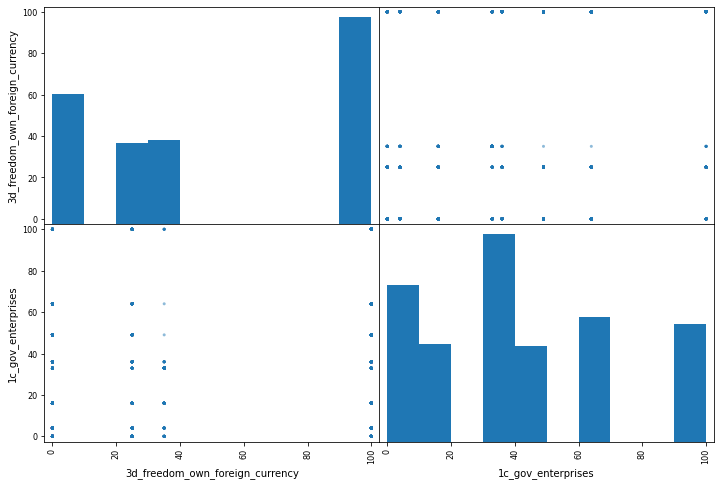

In [56]:
scatter_matrix(Dropped_DF[attributes]**2, figsize=(12, 8))

## Cubed

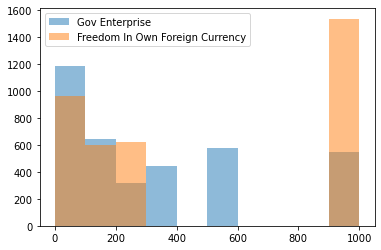

In [50]:
plt.hist(gov_enterprises**3, label='Gov Enterprise', alpha=0.5, bins = 10)
plt.hist(freedom_own_foreign_currency**3, label='Freedom In Own Foreign Currency',alpha=0.5, bins = 10)
plt.legend()

array([[<AxesSubplot:xlabel='3d_freedom_own_foreign_currency', ylabel='3d_freedom_own_foreign_currency'>,
        <AxesSubplot:xlabel='1c_gov_enterprises', ylabel='3d_freedom_own_foreign_currency'>],
       [<AxesSubplot:xlabel='3d_freedom_own_foreign_currency', ylabel='1c_gov_enterprises'>,
        <AxesSubplot:xlabel='1c_gov_enterprises', ylabel='1c_gov_enterprises'>]],
      dtype=object)

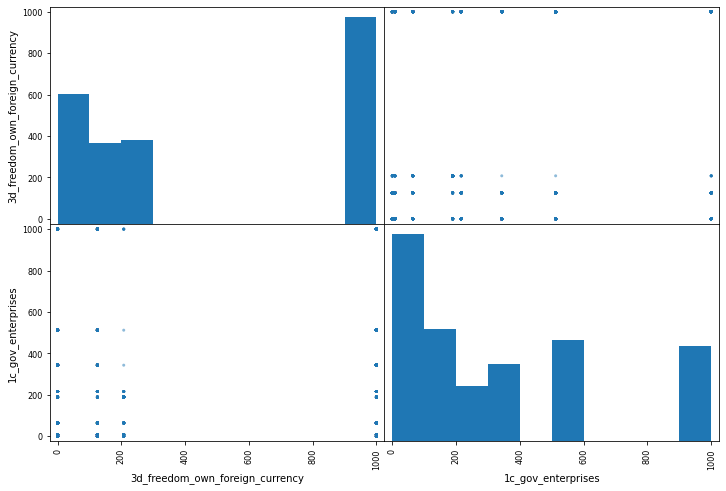

In [57]:
scatter_matrix(Dropped_DF[attributes]**3, figsize=(12, 8))

## Exponential

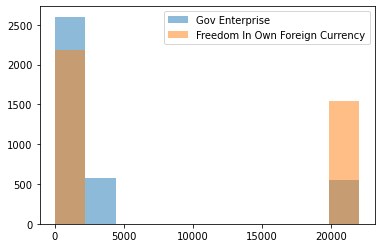

In [52]:
plt.hist(np.exp(gov_enterprises), label='Gov Enterprise', alpha=0.5, bins = 10)
plt.hist(np.exp(freedom_own_foreign_currency), label='Freedom In Own Foreign Currency',alpha=0.5, bins = 10)
plt.legend()

array([[<AxesSubplot:xlabel='3d_freedom_own_foreign_currency', ylabel='3d_freedom_own_foreign_currency'>,
        <AxesSubplot:xlabel='1c_gov_enterprises', ylabel='3d_freedom_own_foreign_currency'>],
       [<AxesSubplot:xlabel='3d_freedom_own_foreign_currency', ylabel='1c_gov_enterprises'>,
        <AxesSubplot:xlabel='1c_gov_enterprises', ylabel='1c_gov_enterprises'>]],
      dtype=object)

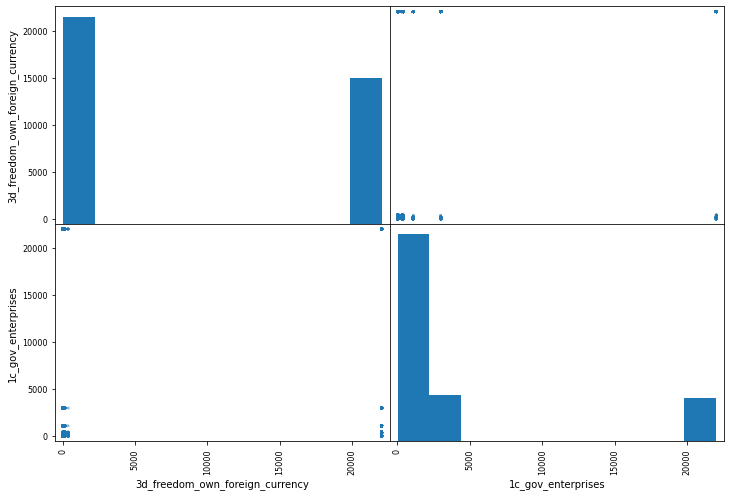

In [58]:
scatter_matrix(np.exp(Dropped_DF[attributes]), figsize=(12, 8))

## Log

```plt.hist(np.log(gov_enterprises), label='Gov Enterprise', alpha=0.5, bins = 10)
plt.hist(np.log(freedom_own_foreign_currency), label='Freedom In Own Foreign Currency',alpha=0.5, bins = 10)
plt.legend()```


## Doens't work Because it gives off an error so we didn't use it since it gives off an error

In [ ]:
plt.hist(np.log(gov_enterprises), label='Gov Enterprise', alpha=0.5, bins = 10)
plt.hist(np.log(freedom_own_foreign_currency), label='Freedom In Own Foreign Currency',alpha=0.5, bins = 10)
plt.legend()

In [ ]:
scatter_matrix(np.log(Dropped_DF[attributes]), figsize=(12, 8))

## I convert the labels into categorical variables of below or above 5. 

## Non Scaled Data

In [60]:
Dropped_DF.loc[Dropped_DF['ECONOMIC FREEDOM'] > 5, 'Econ_Freedom_label'] = '1' # Economic Freedom is above 5
Dropped_DF.loc[Dropped_DF['ECONOMIC FREEDOM'] <= 5, 'Econ_Freedom_label'] = '0'# Economic Freedom is between 0 and 5

In [61]:
Dropped_DF.to_csv('Non_Scaled_Data.csv')

In [62]:
Acutal_Continuous_Values = Dropped_DF['ECONOMIC FREEDOM']
Dropped_ContLablDF = Dropped_DF.drop('ECONOMIC FREEDOM', axis = 1)
X_non_scaled = Dropped_ContLablDF.drop('Econ_Freedom_label', axis = 1)
y_non_scaled = Dropped_ContLablDF.Econ_Freedom_label

In [63]:
print("Length of X:", X_non_scaled.shape, "Length of Y:", y_non_scaled.shape)

Length of X: (3726, 23) Length of Y: (3726,)


In [64]:
from sklearn.model_selection import train_test_split
print("Shape of X:", X_non_scaled.shape, "\nShape of Y:", y_non_scaled.shape)
X_train_non_scaled, X_test_non_scaled, y_train_non_scaled, y_test_non_scaled = train_test_split(X_non_scaled, y_non_scaled, test_size = 0.2, random_state = 42)
print("Train Value Spread\n", y_train_non_scaled.value_counts(),
"\nTest Value Spread\n", y_test_non_scaled.value_counts())

Shape of X: (3726, 23) 
Shape of Y: (3726,)
Train Value Spread
 1    2719
0     261
Name: Econ_Freedom_label, dtype: int64 
Test Value Spread
 1    685
0     61
Name: Econ_Freedom_label, dtype: int64


# K Neighbor Classifier

#### Test to see which one of datasets, either scaled or not produce the best results.

In [65]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, classification_report
paramaters = {'n_neighbors' : [1, 3, 5, 10],
             'weights': ['uniform', 'distance']}
knn = KNeighborsClassifier()
knn.fit(X_train_non_scaled, y_train_non_scaled)
prediction = knn.predict(X_test_non_scaled)

print('\nNon-Scaled Data')

train_accuracy = np.mean(prediction == y_test_non_scaled)
print("\nTraining Accuracy: ", train_accuracy)

train_size = X_train_non_scaled.shape[0]
train_no_correct = train_size  * train_accuracy

print ("\nTrain - No. Of Correct Predictions", train_no_correct, "/", train_size)


print("\nTest Confusion Matrix:")
print(confusion_matrix(y_test_non_scaled, prediction))


precision_test = precision_score(y_test_non_scaled, prediction,average='weighted') 
print("\nTest Precision = %f" % precision_test)

recall_test = recall_score(y_test_non_scaled, prediction,average='weighted')
print("Test Recall = %f" % recall_test)


f1_test = f1_score(y_test_non_scaled, prediction,average='weighted')
print("Test F1 Score = %f" % f1_test)


print("\nClassification Report:")
print(classification_report(y_test_non_scaled, prediction))



Non-Scaled Data

Training Accuracy:  0.9664879356568364

Train - No. Of Correct Predictions 2880.134048257373 / 2980

Test Confusion Matrix:
[[ 44  17]
 [  8 677]]

Test Precision = 0.964927
Test Recall = 0.966488
Test F1 Score = 0.965263

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.72      0.78        61
           1       0.98      0.99      0.98       685

    accuracy                           0.97       746
   macro avg       0.91      0.85      0.88       746
weighted avg       0.96      0.97      0.97       746



## Scaled Datascaled_df

In [66]:
scaled_df.loc[scaled_df['ECONOMIC FREEDOM'] > 5, 'Econ_Freedom_label'] = '1' # Economic Freedom is above 5
scaled_df.loc[scaled_df['ECONOMIC FREEDOM'] <= 5, 'Econ_Freedom_label'] = '0'# Economic Freedom is between 0 and 5

In [67]:
scaled_df.to_csv("scaled_Dataframe.csv")

In [68]:
Acutal_Continuous_Values = scaled_df['ECONOMIC FREEDOM']
Dropped_ContLablDF = scaled_df.drop('ECONOMIC FREEDOM', axis = 1)
X_scaled = Dropped_ContLablDF.drop('Econ_Freedom_label', axis = 1)
y_scaled = Dropped_ContLablDF.Econ_Freedom_label

In [69]:
from sklearn.model_selection import train_test_split
print("Shape of X:", X_scaled.shape, "\nShape of Y:", y_scaled.shape)
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = train_test_split(X_scaled, y_scaled, test_size = 0.2, random_state = 42)
print("\nTrain Value Spread\n", y_train_scaled.value_counts(),
"\nTest Value Spread\n", y_test_scaled.value_counts())

Shape of X: (3726, 23) 
Shape of Y: (3726,)

Train Value Spread
 1    2719
0     261
Name: Econ_Freedom_label, dtype: int64 
Test Value Spread
 1    685
0     61
Name: Econ_Freedom_label, dtype: int64


# K NeighborClassifier

#### Test to see which one of datasets, either scaled or not produce the best results.

In [70]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, classification_report


knn = KNeighborsClassifier(n_neighbors = 5, weights = 'uniform')
knn.fit(X_train_scaled, y_train_scaled)
prediction = knn.predict(X_test_scaled)

print('\nScaled Data')

train_accuracy = np.mean(prediction == y_test_scaled)
print("\nTraining Accuracy: ", train_accuracy)

train_size = X_train_scaled.shape[0]
train_no_correct = train_size  * train_accuracy

print ("\nTrain - No. Of Correct Predictions", train_no_correct, "/", train_size)


print("\nTest Confusion Matrix:")
print(confusion_matrix(y_test_scaled, prediction))


precision_test = precision_score(y_test_scaled, prediction,average='weighted') 
print("\nTest Precision = %f" % precision_test)

recall_test = recall_score(y_test_scaled, prediction,average='weighted')
print("Test Recall = %f" % recall_test)


f1_test = f1_score(y_test_scaled, prediction,average='weighted')
print("Test F1 Score = %f" % f1_test)


print("\nClassification Report:")
print(classification_report(y_test_scaled, prediction))


Scaled Data

Training Accuracy:  0.9718498659517426

Train - No. Of Correct Predictions 2896.112600536193 / 2980

Test Confusion Matrix:
[[ 48  13]
 [  8 677]]

Test Precision = 0.971019
Test Recall = 0.971850
Test F1 Score = 0.971300

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.79      0.82        61
           1       0.98      0.99      0.98       685

    accuracy                           0.97       746
   macro avg       0.92      0.89      0.90       746
weighted avg       0.97      0.97      0.97       746

